<a href="https://colab.research.google.com/github/thomasjithin440/thomasjithin440/blob/main/Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [66]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
from skimage.feature import hog
from skimage import data, exposure
import os
from pathlib import Path
from PIL import Image
import os
from PIL import Image
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import color
import os
from skimage.feature import hog
from skimage import exposure, io, transform
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt


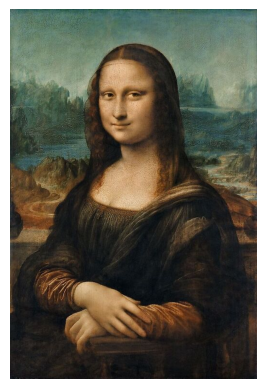

In [87]:
img = cv2.imread('/content/mona.jpg')

# Convert to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the image
plt.imshow(img)
plt.axis('off')
plt.show()

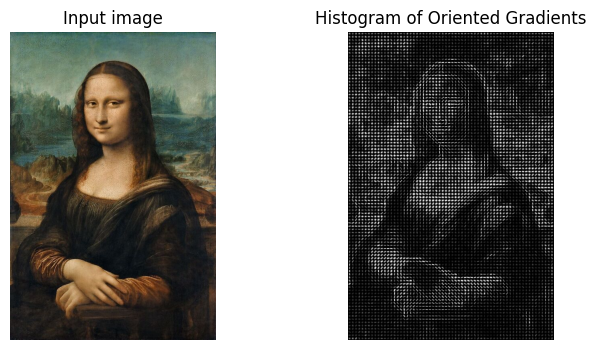

In [5]:
fd, hog_image = hog(
    img,
    orientations=8,
    pixels_per_cell=(8, 8),
    cells_per_block=(1, 1),
    visualize=True,
    channel_axis=-1,
)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(img, cmap=plt.cm.gray)
ax1.set_title('Input image')

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show()

In [21]:
image_folder_path = '/content/drive/MyDrive/hog_image_recognition/input/person_car_cup'
os.chdir(image_folder_path)


In [22]:
os.listdir(image_folder_path)

['person', 'cup', 'car']

In [23]:
# |folder_names = ['person', 'cup', 'car']

# for folder_name in folder_names:
#     folder_path = os.path.join(image_folder_path, folder_name)

#     if not os.path.exists(folder_path):
#         print(f"Folder '{folder_name}' not found.")
#         continue

#     print(f"Images in folder '{folder_name}':")

#     for filename in os.listdir(folder_path):
#         if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
#             image_path = os.path.join(folder_path, filename)
#             try:
#                 img = Image.open(image_path)
#                 plt.imshow(img)
#                 plt.axis('off')
#                 plt.title(filename)
#                 plt.show()
#             except IOError:
#                 print(f"Error opening image: {image_path}")

#     print("-" * 20)

Images in folder 'person':


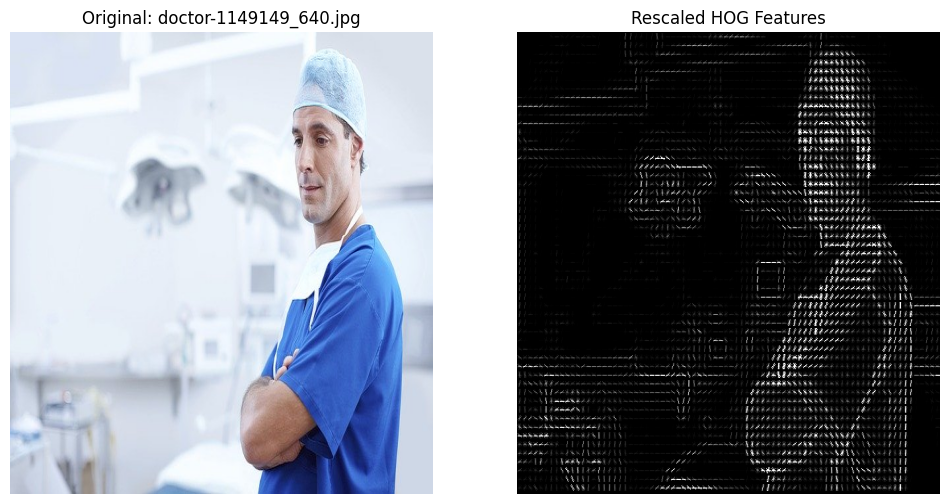

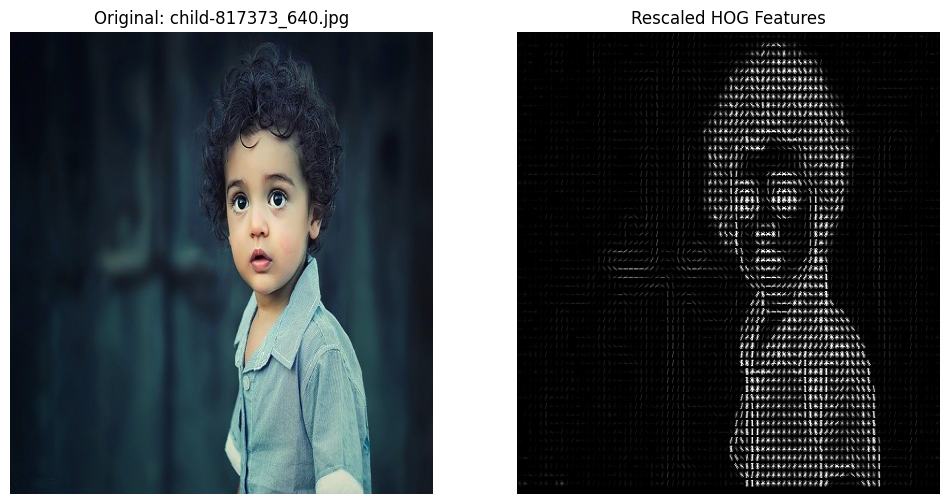

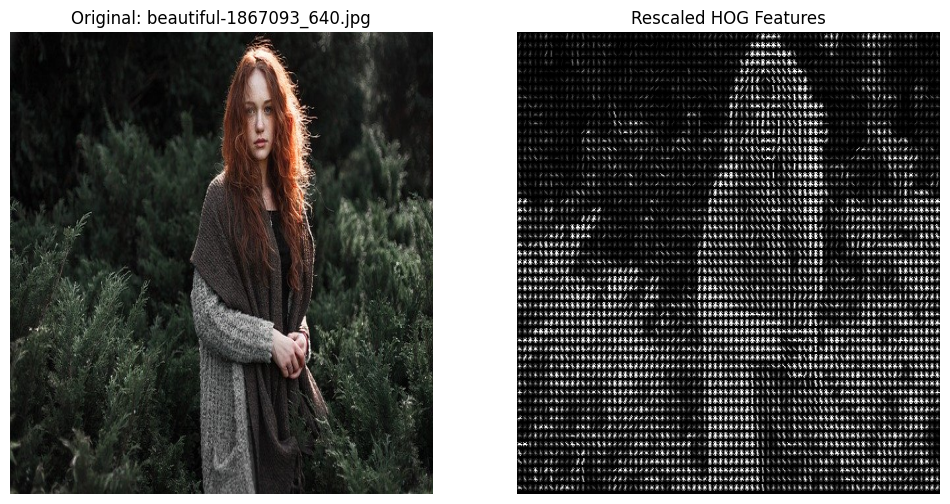

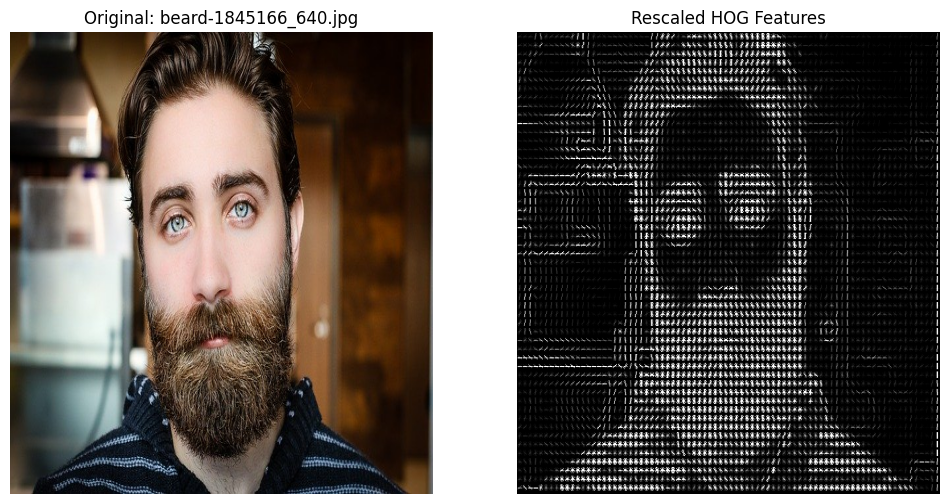

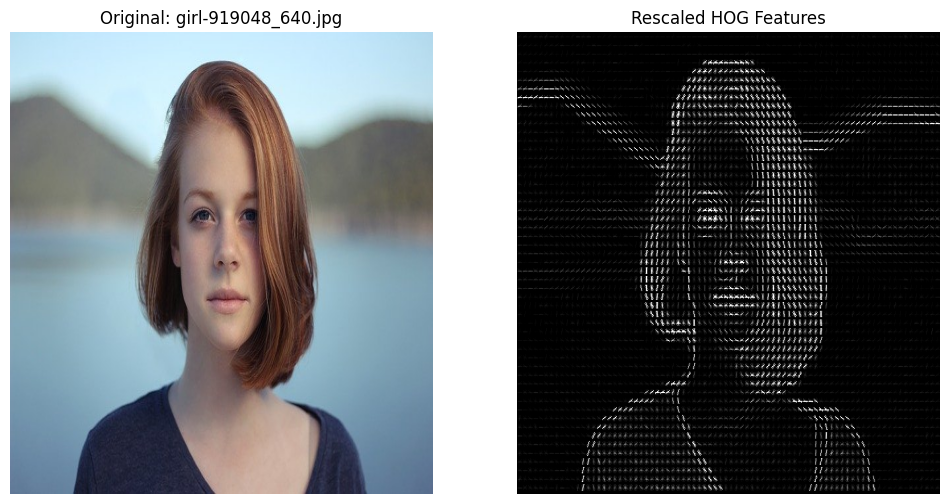

--------------------
Images in folder 'cup':


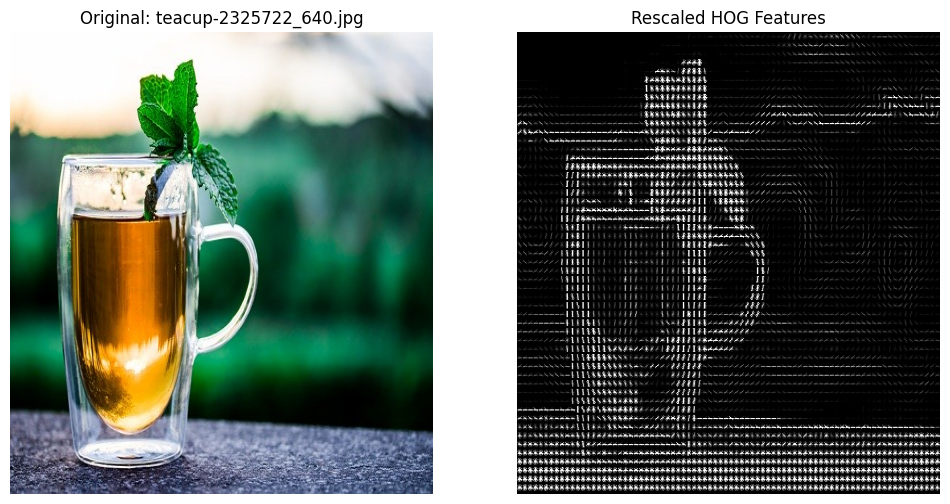

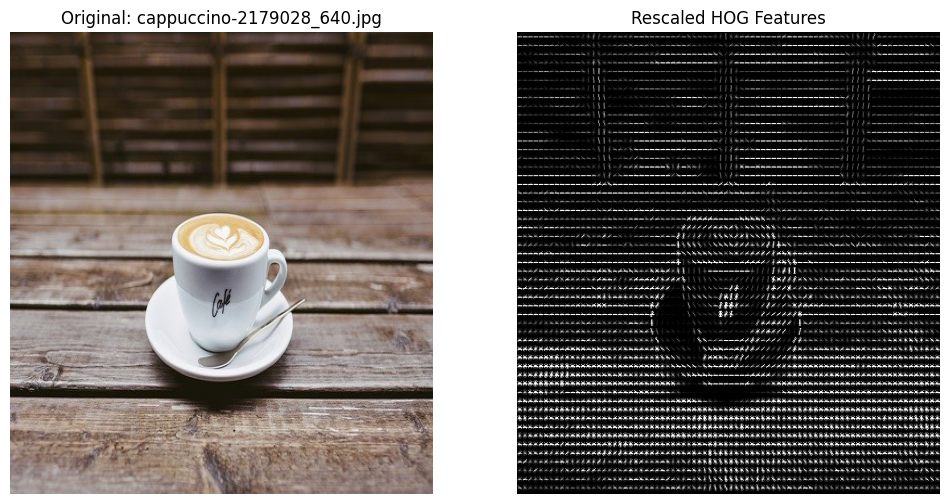

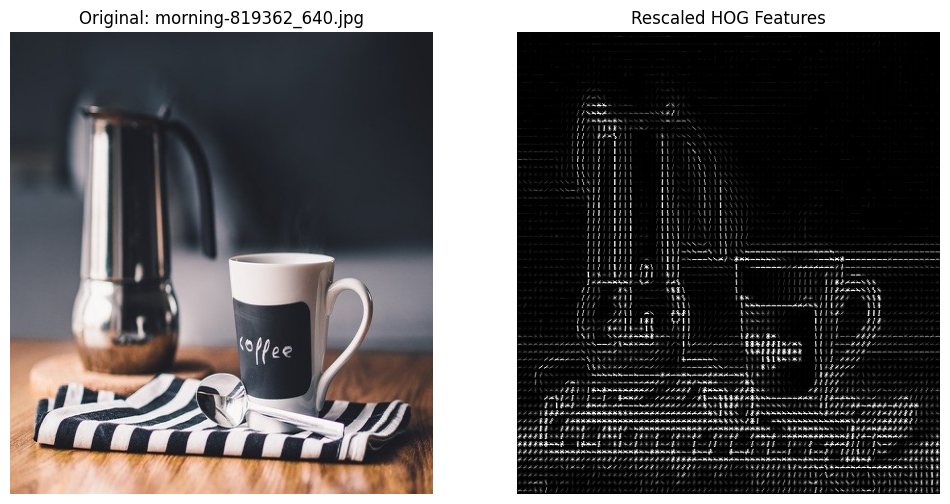

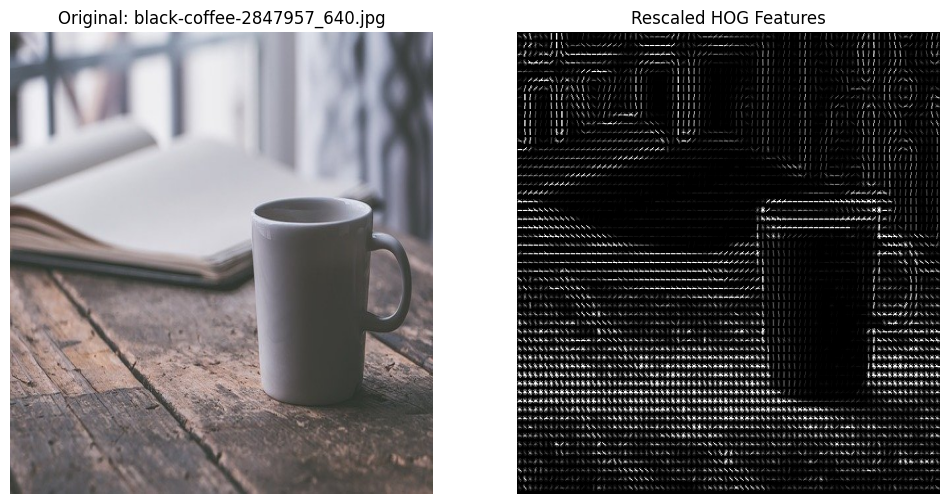

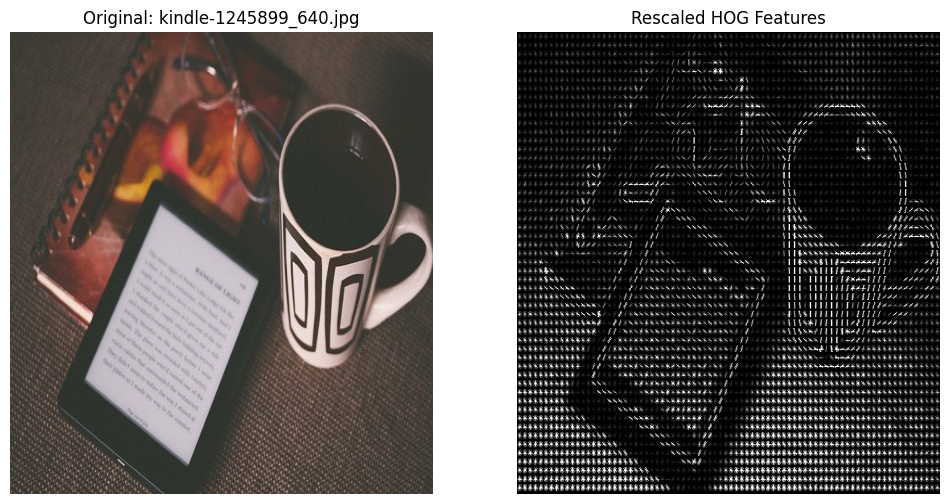

--------------------
Images in folder 'car':


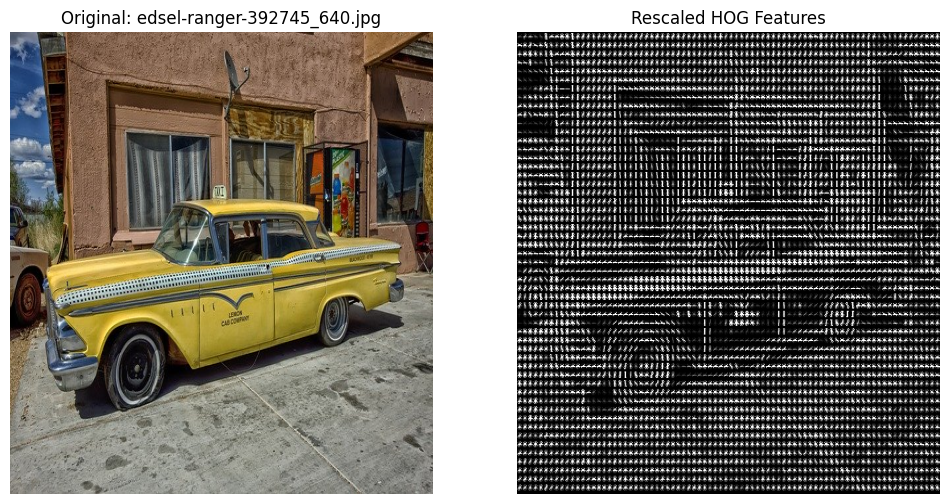

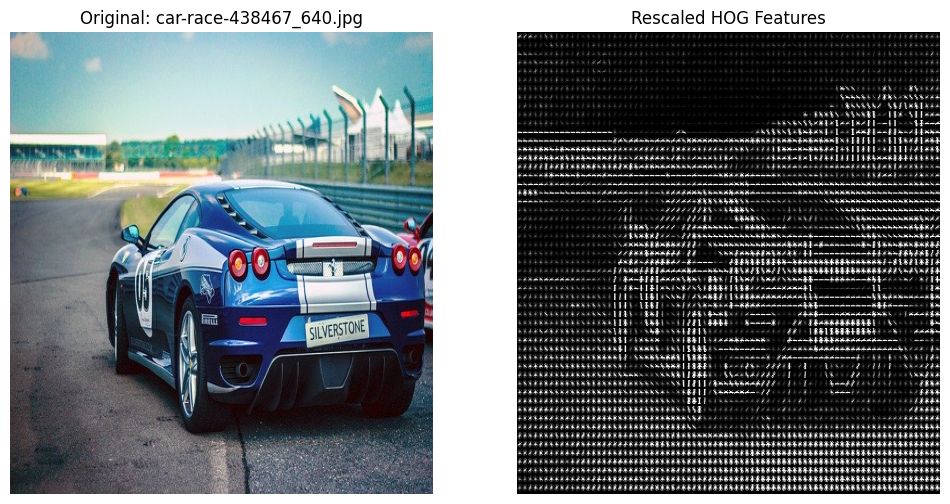

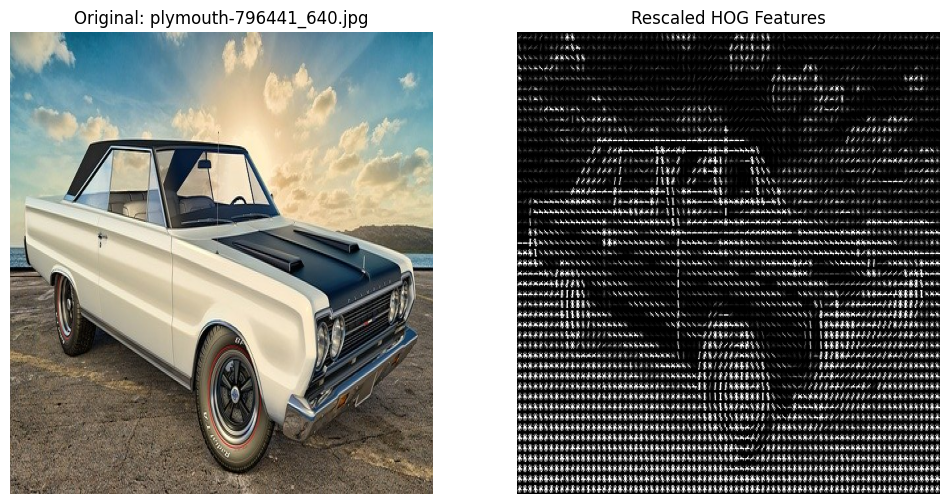

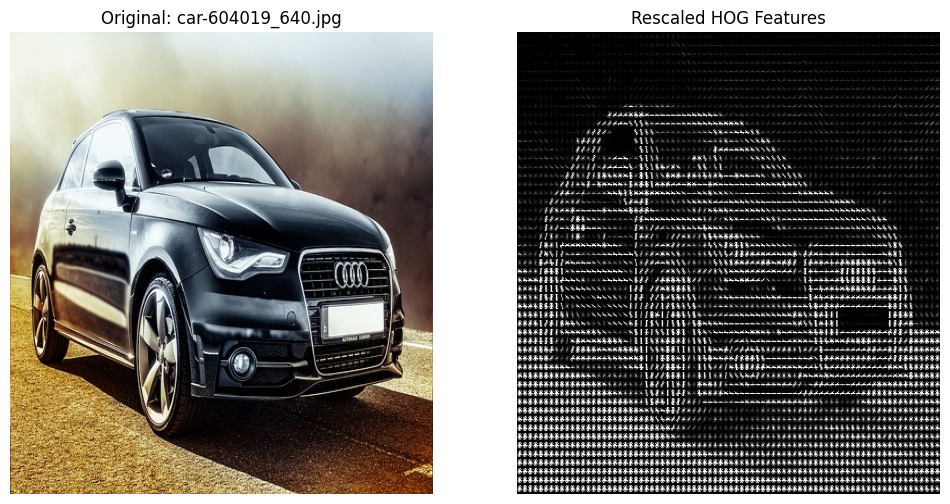

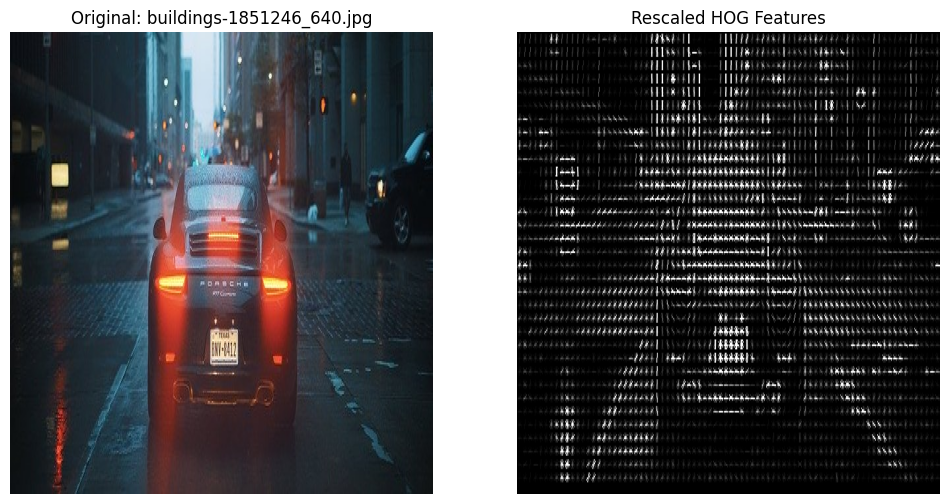

--------------------


In [26]:
folder_names = ['person', 'cup', 'car']

for folder_name in folder_names:
    folder_path = os.path.join(image_folder_path, folder_name)

    if not os.path.exists(folder_path):
        print(f"Folder '{folder_name}' not found.")
        continue

    print(f"Images in folder '{folder_name}':")

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
            image_path = os.path.join(folder_path, filename)
            try:
                img = Image.open(image_path)
                img_gray = img.convert('L')

                # Compute HOG features
                features, hog_image = hog(img_gray, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

                # Rescale HOG image for better contrast
                hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

                # Plot the original image and the HOG image
                fig, axes = plt.subplots(1, 2, figsize=(12, 6))
                axes[0].imshow(img, aspect='auto')
                axes[0].axis('off')
                axes[0].set_title(f"Original: {filename}")

                axes[1].imshow(hog_image_rescaled, cmap=plt.cm.gray, aspect='auto')
                axes[1].axis('off')
                axes[1].set_title("Rescaled HOG Features")

                plt.show()
            except IOError:
                print(f"Error opening image: {image_path}")

    print("-" * 20)

In [38]:
# image_folder_path = '/content/drive/MyDrive/hog_image_recognition/input/person_car_cup'
# os.chdir(image_folder_path)
# features_list = []
# labels_list = []

# folder_names = ['person', 'cup', 'car']

# for folder_name in folder_names:
#     folder_path = os.path.join(image_folder_path, folder_name)
#     for filename in os.listdir(folder_path):
#         if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
#             image_path = os.path.join(folder_path, filename)
#             try:
#                 img = Image.open(image_path).convert('L')
#                 img_resized = img.resize((128, 128))
#                 features, hog_image = hog(
#                     np.array(img_resized),
#                     pixels_per_cell=(8, 8),
#                     cells_per_block=(2, 2),
#                     visualize=True
#                 )
#                 features_list.append(features)
#                 labels_list.append(folder_name)
#             except IOError:
#                 print(f"Error opening image: {image_path}")

# # Convert to NumPy arrays
# features = np.array(features_list)
# labels = np.array(labels_list)

# # Train-Test Split
# X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# # Train SVM
# clf = svm.SVC(kernel='linear')
# clf.fit(X_train, y_train)

# # Make predictions
# y_pred = clf.predict(X_test)

# # Evaluate the model
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy}")
# print(classification_report(y_test, y_pred))


In [41]:
train_image_folder_path = '/content/drive/MyDrive/hog_image_recognition/input/person_car_cup'
test_image_folder_path = '/content/drive/MyDrive/hog_image_recognition/test_images/person_car_cup'
os.chdir(train_image_folder_path)

features_list = []
labels_list = []
folder_names = ['person', 'cup', 'car']

# Load and preprocess training images
for folder_name in folder_names:
    folder_path = os.path.join(train_image_folder_path, folder_name)
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
            image_path = os.path.join(folder_path, filename)
            try:
                img = Image.open(image_path).convert('L')
                img_resized = img.resize((128, 128))
                features, hog_image = hog(
                    np.array(img_resized),
                    pixels_per_cell=(8, 8),
                    cells_per_block=(2, 2),
                    visualize=True
                )
                features_list.append(features)
                labels_list.append(folder_name)
            except IOError:
                print(f"Error opening image: {image_path}")

features = np.array(features_list)
labels = np.array(labels_list)

X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train SVM
clf = svm.SVC(kernel='linear')
clf.fit(X_train, y_train)

# Evaluate the model on validation data
y_test_pred = clf.predict(X_test)
val_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Validation Accuracy: {val_accuracy}")
print(classification_report(y_test, y_test_pred))

# Load and preprocess test images
test_features_list = []
test_labels_list = []

for filename in os.listdir(test_image_folder_path):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
        image_path = os.path.join(test_image_folder_path, filename)
        try:
            img = Image.open(image_path).convert('L')
            img_resized = img.resize((128, 128))
            features, hog_image = hog(
                np.array(img_resized),
                pixels_per_cell=(8, 8),
                cells_per_block=(2, 2),
                visualize=True
            )
            test_features_list.append(features)
            test_labels_list.append(filename)
        except IOError:
            print(f"Error opening image: {image_path}")

# Convert test data to NumPy arrays
test_features = np.array(test_features_list)

# Make predictions on test images
test_predictions = clf.predict(test_features)

# Display predictions
print("Predictions on test images:\n")
for filename, prediction in zip(test_labels_list, test_predictions):
    print(f"Image: {filename}, Predicted Label: {prediction}")


Validation Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

         car       1.00      1.00      1.00         1
         cup       0.00      0.00      0.00         1
      person       0.50      1.00      0.67         1

    accuracy                           0.67         3
   macro avg       0.50      0.67      0.56         3
weighted avg       0.50      0.67      0.56         3



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Predictions on test images:

Image: squad-car-1209719_640.jpg, Predicted Label: cup
Image: cup-2315563_640.jpg, Predicted Label: cup
Image: man-2785071_640.jpg, Predicted Label: person


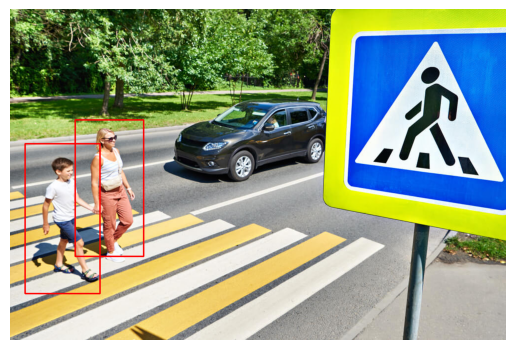

In [72]:
img = cv2.imread('/content/pedestrians.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

boxes, weights = hog.detectMultiScale(img, winStride=(8, 8), padding=(8, 8), scale=1.05)

for (x, y, w, h) in boxes:
    cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)

plt.imshow(img)
plt.axis('off')
plt.show()

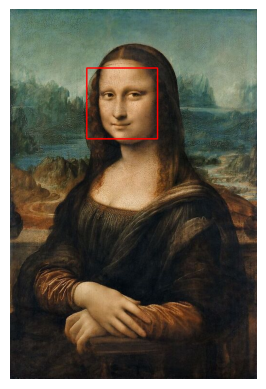

In [84]:
img = cv2.imread('/content/mona.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
faces = face_cascade.detectMultiScale(img_rgb, scaleFactor=1.1, minNeighbors=5, minSize=(10, 10))

for (x, y, w, h) in faces:
    cv2.rectangle(img_rgb, (x, y), (x + w, y + h), (255, 0, 0), 2)

plt.imshow(img_rgb)
plt.axis('off')
plt.show()